# Foundation Models Comparison: astroPT vs AION

This notebook compares embeddings from two different multimodal foundation models:

**astroPT Multimodal**: Transformer model trained on DESI spectra + Euclid images
- Checkpoint: iteration 21000
- Location: `/pbs/home/a/astroinfo09/logs/logs/astropt_multimodal_full_20251106_011934/`

**AION Multimodal**: Foundation model trained on Euclid images + DESI spectra
- Embeddings from Maxime's work
- Location: `/pbs/throng/training/astroinfo2025/work/maxime/data_all_tokens_spectrums.pt`

We compare how the two models encode spectral and imaging information in their embedding spaces.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import torch
from astropy.io import fits
from astropy.table import Table
import umap
import time
from scipy.stats import spearmanr
from sklearn.metrics.pairwise import cosine_similarity

# Configure matplotlib
plt.style.use('default')
sns.set_palette("husl")
%matplotlib inline

## 1. Load astroPT Multimodal Embeddings

Load the embeddings extracted from the astroPT multimodal model (spectra + images).

In [2]:
# Path to astroPT multimodal embeddings
embeddings_dir = Path("/pbs/throng/training/astroinfo2025/data/astroPT_euclid_desi_dataset/astropt/embeddings_output_21000")

print("Loading astroPT multimodal embeddings...")
print(f"Embeddings directory: {embeddings_dir}")

# Check directory contents
if embeddings_dir.exists():
    files = list(embeddings_dir.glob("*.npy")) + list(embeddings_dir.glob("*.npz"))
    print(f"\nFound {len(files)} files:")
    for f in files[:10]:
        print(f"  {f.name}")
    if len(files) > 10:
        print(f"  ... and {len(files) - 10} more")
else:
    print(f"⚠ WARNING: Directory not found")

# Try to load embeddings
try:
    # Load the multimodal training files
    astropt_embeddings = np.load(embeddings_dir / "multimodal_train_embeddings.npy")
    astropt_targetids = np.load(embeddings_dir / "multimodal_train_target_ids.npy")
    astropt_object_ids = np.load(embeddings_dir / "multimodal_train_object_ids.npy")
    astropt_redshifts = np.load(embeddings_dir / "multimodal_train_redshifts.npy")
    astropt_has_image = np.load(embeddings_dir / "multimodal_train_has_image.npy")
    astropt_has_spectrum = np.load(embeddings_dir / "multimodal_train_has_spectrum.npy")
    
    print(f"\n✓ astroPT embeddings loaded: {astropt_embeddings.shape}")
    print(f"✓ Target IDs: {len(astropt_targetids)}")
    print(f"✓ Object IDs: {len(astropt_object_ids)}")
    print(f"✓ Redshifts: {len(astropt_redshifts)}")
    print(f"  Redshift range: [{astropt_redshifts.min():.3f}, {astropt_redshifts.max():.3f}]")
    print(f"\n✓ Data availability:")
    print(f"  Has spectrum: {astropt_has_spectrum.sum()} ({100*astropt_has_spectrum.sum()/len(astropt_has_spectrum):.1f}%)")
    print(f"  Has image: {astropt_has_image.sum()} ({100*astropt_has_image.sum()/len(astropt_has_image):.1f}%)")
    print(f"  Has both: {(astropt_has_spectrum & astropt_has_image).sum()} ({100*(astropt_has_spectrum & astropt_has_image).sum()/len(astropt_has_spectrum):.1f}%)")

except FileNotFoundError as e:
    print(f"\n❌ Could not find embeddings files.")
    print(f"Error: {e}")
    print("\nPlease check the directory structure.")
    raise

Loading astroPT multimodal embeddings...
Embeddings directory: /pbs/throng/training/astroinfo2025/data/astroPT_euclid_desi_dataset/astropt/embeddings_output_21000

Found 8 files:
  multimodal_train_object_ids.npy
  multimodal_train_embeddings.npy
  multimodal_train_redshifts.npy
  multimodal_train_has_image.npy
  embeddings_2d_pca.npy
  multimodal_train_target_ids.npy
  embeddings_10d_pca.npy
  multimodal_train_has_spectrum.npy

✓ astroPT embeddings loaded: (12210, 768)
✓ Target IDs: 12210
✓ Object IDs: 12210
✓ Redshifts: 12210
  Redshift range: [0.009, 1.797]

✓ Data availability:
  Has spectrum: 12210 (100.0%)
  Has image: 12210 (100.0%)
  Has both: 12210 (100.0%)


## 2. Load AION Multimodal Embeddings

Load the embeddings from AION model.

In [3]:
# Path to AION embeddings
aion_path = "/pbs/throng/training/astroinfo2025/work/maxime/data_all_tokens_spectrums.pt"

print("Loading AION embeddings...")
import torch
aion_data = torch.load(aion_path, map_location="cpu")

aion_records = aion_data if isinstance(aion_data, list) else [aion_data]
print(f"✓ AION data loaded: {len(aion_records)} records")

# Extract embeddings
def stack_embeddings(records, key):
    """Extract and stack embeddings for a given key."""
    vectors = []
    indices = []
    
    for idx, rec in enumerate(records):
        tensor = rec.get(key)
        if tensor is None:
            continue
        if isinstance(tensor, torch.Tensor):
            vectors.append(tensor.detach().cpu().numpy())
        else:
            vectors.append(np.asarray(tensor))
        indices.append(idx)
    
    if not vectors:
        raise ValueError(f"No embeddings found for key '{key}'")
    
    return np.stack(vectors, axis=0), np.array(indices)

# Extract AION multimodal embeddings (spectra + images)
aion_embeddings, _ = stack_embeddings(aion_records, "embedding_hsc_desi")

print(f"✓ AION multimodal embeddings: {aion_embeddings.shape}")

# Extract AION object IDs and redshifts
aion_object_ids = []
aion_redshifts = []

for rec in aion_records:
    obj_id = rec.get('object_id') or rec.get('TARGETID') or rec.get('targetid')
    aion_object_ids.append(obj_id if obj_id is not None else np.nan)
    
    z = rec.get('redshift') or rec.get('Z') or rec.get('z')
    aion_redshifts.append(z if z is not None else np.nan)

aion_object_ids = np.array(aion_object_ids)
aion_redshifts = np.array(aion_redshifts, dtype=float)

Loading AION embeddings...
✓ AION data loaded: 15263 records
✓ AION multimodal embeddings: (15263, 768)


## 3. Load Catalog and Match Objects

Load the catalog to get physical properties for both sets of embeddings.

In [4]:
# Path to catalog
catalog_path = "/pbs/throng/training/astroinfo2025/data/astroPT_euclid_desi_dataset/desi_euclid_catalog.fits"

print("Loading catalog...")
with fits.open(catalog_path) as hdul:
    catalog = Table(hdul[1].data)

print(f"✓ Catalog loaded: {len(catalog)} entries")

# Create ID mappings for both TARGETID and object_id
# astroPT uses TARGETID (DESI), AION uses object_id (Euclid)

# TARGETID mapping for astroPT
if 'TARGETID' in catalog.colnames:
    targetid_catalog = np.array(catalog['TARGETID'], dtype=np.int64)
    valid_mask = targetid_catalog > 0
    targetid_to_idx = {np.int64(tid): idx for tid, idx in zip(targetid_catalog[valid_mask], np.where(valid_mask)[0])}
    print(f"✓ TARGETID mapping created: {len(targetid_to_idx)} entries")
else:
    targetid_to_idx = {}
    print("⚠ TARGETID column not found")

# object_id mapping for AION
if 'object_id' in catalog.colnames:
    objectid_catalog = np.array(catalog['object_id'], dtype=np.int64)
    valid_mask = objectid_catalog > 0
    objectid_to_idx = {np.int64(oid): idx for oid, idx in zip(objectid_catalog[valid_mask], np.where(valid_mask)[0])}
    print(f"✓ object_id mapping created: {len(objectid_to_idx)} entries")
else:
    objectid_to_idx = {}
    print("⚠ object_id column not found")

Loading catalog...
✓ Catalog loaded: 15999 entries
✓ TARGETID mapping created: 15263 entries
✓ object_id mapping created: 15263 entries


In [5]:
def match_to_catalog(object_ids, id_to_idx):
    """Match object IDs to catalog indices."""
    matched_indices = []
    unmatched_count = 0
    
    for obj_id in object_ids:
        # Ensure obj_id is np.int64 for consistent lookup
        obj_id = np.int64(obj_id)
        if obj_id in id_to_idx:
            matched_indices.append(id_to_idx[obj_id])
        else:
            matched_indices.append(-1)
            unmatched_count += 1
    
    return np.array(matched_indices), unmatched_count

# Match astroPT using TARGETID
astropt_matched, astropt_unmatched = match_to_catalog(astropt_targetids, targetid_to_idx)
astropt_match_rate = (len(astropt_matched) - astropt_unmatched) / len(astropt_targetids) * 100

print(f"\nastroPT matching (using TARGETID):")
print(f"  Matched: {len(astropt_matched) - astropt_unmatched}/{len(astropt_targetids)} ({astropt_match_rate:.1f}%)")

# Match AION using object_id (Euclid IDs)
aion_object_ids_int = np.array([np.int64(oid) for oid in aion_object_ids])
aion_matched, aion_unmatched = match_to_catalog(aion_object_ids_int, objectid_to_idx)
aion_match_rate = (len(aion_matched) - aion_unmatched) / len(aion_object_ids_int) * 100

print(f"\nAION matching (using object_id):")
print(f"  Matched: {len(aion_matched) - aion_unmatched}/{len(aion_object_ids_int)} ({aion_match_rate:.1f}%)")


astroPT matching (using TARGETID):
  Matched: 12210/12210 (100.0%)

AION matching (using object_id):
  Matched: 15263/15263 (100.0%)


In [6]:
# Extract physical properties for both datasets
def safe_extract(matched_indices, column_name):
    """Extract column values, filling unmatched entries with NaN"""
    if column_name not in catalog.colnames:
        print(f"⚠ Column '{column_name}' not found in catalog")
        return np.full(len(matched_indices), np.nan, dtype=float)
    
    values = np.full(len(matched_indices), np.nan, dtype=float)
    mask = matched_indices >= 0
    values[mask] = catalog[column_name][matched_indices[mask]]
    return values

print("Extracting physical and morphological properties...\n")

# astroPT spectral/physical properties
if astropt_redshifts is None or np.all(np.isnan(astropt_redshifts)):
    astropt_redshifts = safe_extract(astropt_matched, 'Z')
    if np.all(np.isnan(astropt_redshifts)):
        astropt_redshifts = safe_extract(astropt_matched, 'REDSHIFT')

astropt_logm = safe_extract(astropt_matched, 'LOGM')
astropt_logsfr = safe_extract(astropt_matched, 'LOGSFR')
astropt_dn4000 = safe_extract(astropt_matched, 'DN4000')
astropt_gr = safe_extract(astropt_matched, 'GR')
astropt_ssfr = astropt_logsfr - astropt_logm

# astroPT morphological properties
astropt_ellipticity = safe_extract(astropt_matched, 'ellipticity')
astropt_kron_radius = safe_extract(astropt_matched, 'kron_radius')
astropt_concentration = safe_extract(astropt_matched, 'concentration')
astropt_asymmetry = safe_extract(astropt_matched, 'asymmetry')
astropt_smoothness = safe_extract(astropt_matched, 'smoothness')
astropt_gini = safe_extract(astropt_matched, 'gini')
astropt_sersic_index = safe_extract(astropt_matched, 'sersic_sersic_vis_index')
astropt_has_spiral_arms = safe_extract(astropt_matched, 'has_spiral_arms_yes')
astropt_disk_edge_on = safe_extract(astropt_matched, 'disk_edge_on_yes')
astropt_det_quality_flag = safe_extract(astropt_matched, 'det_quality_flag')

# astroPT emission line properties
astropt_halpha_flux = safe_extract(astropt_matched, 'HALPHA_FLUX')
astropt_hbeta_flux = safe_extract(astropt_matched, 'HBETA_FLUX')
astropt_halpha_hbeta_ratio = np.full(len(astropt_halpha_flux), np.nan)
valid_mask = (astropt_hbeta_flux > 0) & (astropt_halpha_flux > 0)
astropt_halpha_hbeta_ratio[valid_mask] = astropt_halpha_flux[valid_mask] / astropt_hbeta_flux[valid_mask]

# astroPT Signal-to-Noise Ratios
astropt_snr_b = safe_extract(astropt_matched, 'SNR_B')
astropt_snr_r = safe_extract(astropt_matched, 'SNR_R')
astropt_snr_z = safe_extract(astropt_matched, 'SNR_Z')

# AION spectral/physical properties
if np.all(np.isnan(aion_redshifts)):
    aion_redshifts = safe_extract(aion_matched, 'Z')
    if np.all(np.isnan(aion_redshifts)):
        aion_redshifts = safe_extract(aion_matched, 'REDSHIFT')

aion_logm = safe_extract(aion_matched, 'LOGM')
aion_logsfr = safe_extract(aion_matched, 'LOGSFR')
aion_dn4000 = safe_extract(aion_matched, 'DN4000')
aion_gr = safe_extract(aion_matched, 'GR')
aion_ssfr = aion_logsfr - aion_logm

# AION morphological properties
aion_ellipticity = safe_extract(aion_matched, 'ellipticity')
aion_kron_radius = safe_extract(aion_matched, 'kron_radius')
aion_concentration = safe_extract(aion_matched, 'concentration')
aion_asymmetry = safe_extract(aion_matched, 'asymmetry')
aion_smoothness = safe_extract(aion_matched, 'smoothness')
aion_gini = safe_extract(aion_matched, 'gini')
aion_sersic_index = safe_extract(aion_matched, 'sersic_sersic_vis_index')
aion_has_spiral_arms = safe_extract(aion_matched, 'has_spiral_arms_yes')
aion_disk_edge_on = safe_extract(aion_matched, 'disk_edge_on_yes')
aion_det_quality_flag = safe_extract(aion_matched, 'det_quality_flag')

# AION emission line properties
aion_halpha_flux = safe_extract(aion_matched, 'HALPHA_FLUX')
aion_hbeta_flux = safe_extract(aion_matched, 'HBETA_FLUX')
aion_halpha_hbeta_ratio = np.full(len(aion_halpha_flux), np.nan)
valid_mask = (aion_hbeta_flux > 0) & (aion_halpha_flux > 0)
aion_halpha_hbeta_ratio[valid_mask] = aion_halpha_flux[valid_mask] / aion_hbeta_flux[valid_mask]

# AION Signal-to-Noise Ratios
aion_snr_b = safe_extract(aion_matched, 'SNR_B')
aion_snr_r = safe_extract(aion_matched, 'SNR_R')
aion_snr_z = safe_extract(aion_matched, 'SNR_Z')

print("✓ Physical and morphological properties extracted for both datasets")

Extracting physical and morphological properties...

✓ Physical and morphological properties extracted for both datasets


## 4. Find Common Objects

Identify objects that appear in both astroPT and AION datasets for direct comparison.

In [7]:
# Convert to int for matching - astroPT uses TARGETID, AION uses object_id
# These are different ID systems (DESI vs Euclid) so we need to check catalog for overlap

astropt_ids_int = np.array(astropt_targetids, dtype=np.int64)
aion_ids_int = np.array([np.int64(oid) for oid in aion_object_ids])

# Find which catalog indices contain both TARGETID and object_id matches
# This gives us objects that have both DESI spectra (TARGETID) and Euclid images (object_id)
astropt_catalog_indices = astropt_matched[astropt_matched >= 0]
aion_catalog_indices = aion_matched[aion_matched >= 0]

common_catalog_indices = np.intersect1d(astropt_catalog_indices, aion_catalog_indices)

print(f"\n{'='*60}")
print(f"COMMON OBJECTS ANALYSIS")
print(f"{'='*60}")
print(f"astroPT total objects: {len(astropt_ids_int)}")
print(f"astroPT matched to catalog: {(astropt_matched >= 0).sum()}")
print(f"AION total objects: {len(aion_ids_int)}")
print(f"AION matched to catalog: {(aion_matched >= 0).sum()}")
print(f"Common catalog entries: {len(common_catalog_indices)}")
print(f"{'='*60}")

if len(common_catalog_indices) > 0:
    # Create masks for common objects
    astropt_common_mask = np.isin(astropt_matched, common_catalog_indices)
    aion_common_mask = np.isin(aion_matched, common_catalog_indices)
    
    # Create aligned indices
    astropt_common_indices = np.where(astropt_common_mask)[0]
    aion_common_indices = np.where(aion_common_mask)[0]
    
    print(f"\n✓ Found {len(common_catalog_indices)} common catalog entries")
    print(f"   astroPT indices: {len(astropt_common_indices)}")
    print(f"   AION indices: {len(aion_common_indices)}")
else:
    print("\n⚠ WARNING: No common catalog entries found between astroPT and AION datasets")
    print("   This is expected if AION uses Euclid object_id and astroPT uses DESI TARGETID")
    print("   Will proceed with separate visualizations only")


COMMON OBJECTS ANALYSIS
astroPT total objects: 12210
astroPT matched to catalog: 12210
AION total objects: 15263
AION matched to catalog: 15263
Common catalog entries: 12210

✓ Found 12210 common catalog entries
   astroPT indices: 12210
   AION indices: 12210


## 5. Compute UMAP Projections

Apply UMAP to all three embedding types for visualization.

In [8]:
def compute_umap_projection(embeddings, name, random_state=42):
    """Compute UMAP projection for embeddings."""
    print(f"Running UMAP for {name}...")
    
    umap_model = umap.UMAP(
        n_neighbors=15,
        min_dist=0.1,
        n_components=2,
        metric='cosine',
        random_state=random_state
    )
    
    start_time = time.time()
    projection = umap_model.fit_transform(embeddings)
    elapsed = time.time() - start_time
    
    print(f"✓ {name} UMAP completed in {elapsed:.2f} seconds")
    return projection

print("Computing UMAP projections...\n")

# Compute UMAP for both models' multimodal embeddings
umap_astropt = compute_umap_projection(astropt_embeddings, "astroPT multimodal")
umap_aion = compute_umap_projection(aion_embeddings, "AION multimodal")

print("\n✓ All UMAP projections completed!")

Computing UMAP projections...

Running UMAP for astroPT multimodal...


/pbs/throng/training/astroinfo2025/env/astroPT/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


✓ astroPT multimodal UMAP completed in 17.49 seconds
Running UMAP for AION multimodal...


/pbs/throng/training/astroinfo2025/env/astroPT/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


✓ AION multimodal UMAP completed in 6.78 seconds

✓ All UMAP projections completed!


## 6. Comparison Visualization - Redshift

Side-by-side comparison of embeddings from both models, colored by redshift.

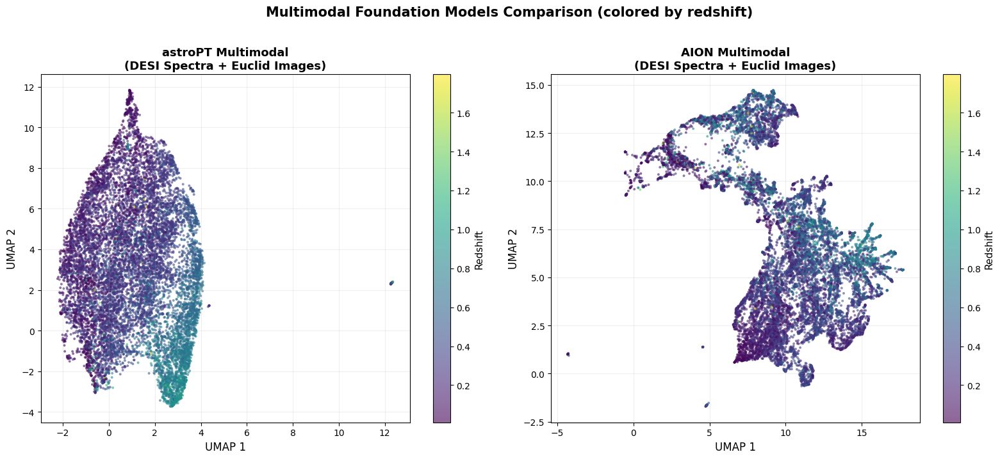

Saved: model_comparison_redshift.png


In [9]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

projections = [umap_astropt, umap_aion]
redshift_data = [astropt_redshifts, aion_redshifts]
titles = [
    'astroPT Multimodal\n(DESI Spectra + Euclid Images)',
    'AION Multimodal\n(DESI Spectra + Euclid Images)'
]

for ax, proj, z_data, title in zip(axes, projections, redshift_data, titles):
    valid_z = ~np.isnan(z_data)
    
    if valid_z.sum() > 0:
        scatter = ax.scatter(
            proj[valid_z, 0],
            proj[valid_z, 1],
            c=z_data[valid_z],
            cmap='viridis',
            s=8,
            alpha=0.6,
            edgecolors='none'
        )
        cbar = plt.colorbar(scatter, ax=ax)
        cbar.set_label('Redshift', fontsize=11)
        
        if (~valid_z).sum() > 0:
            ax.scatter(
                proj[~valid_z, 0],
                proj[~valid_z, 1],
                s=5,
                color='lightgray',
                alpha=0.3,
                edgecolors='none'
            )
    else:
        ax.scatter(proj[:, 0], proj[:, 1], s=8, alpha=0.6)
    
    ax.set_xlabel('UMAP 1', fontsize=12)
    ax.set_ylabel('UMAP 2', fontsize=12)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.grid(alpha=0.2)

fig.suptitle('Multimodal Foundation Models Comparison (colored by redshift)', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('model_comparison_redshift.png', dpi=300, bbox_inches='tight')
plt.show()

print("Saved: model_comparison_redshift.png")

## 7. Comparison Visualization - Physical Properties

Compare how different models encode physical properties in their embedding spaces.


SPECTRAL/PHYSICAL PROPERTIES COMPARISONS



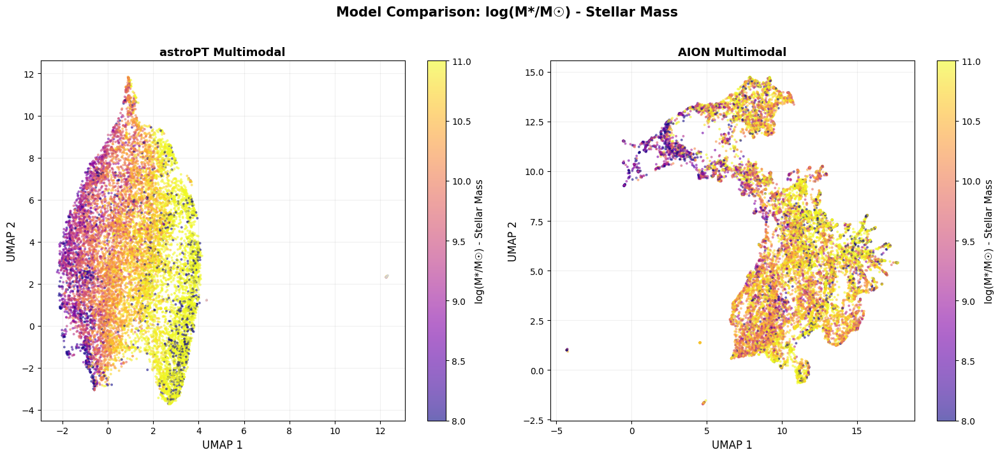

Saved: model_comparison_logm.png


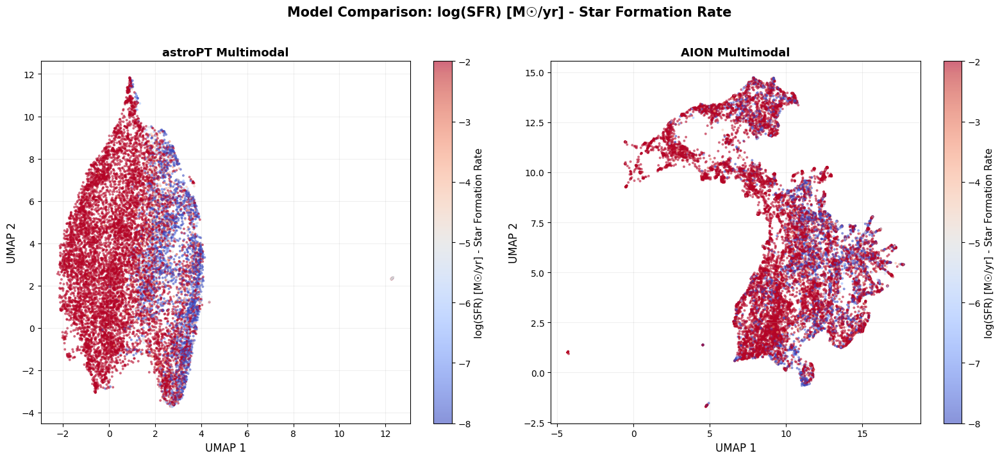

Saved: model_comparison_logsfr.png


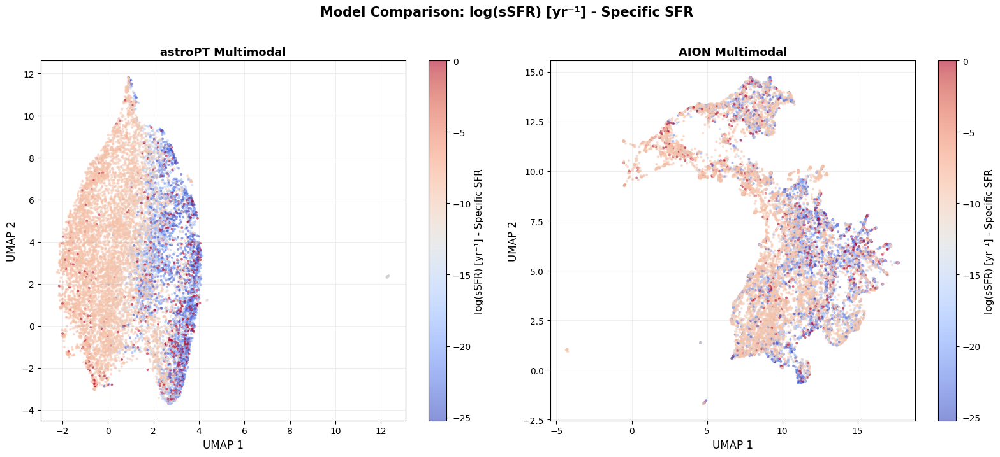

Saved: model_comparison_ssfr.png


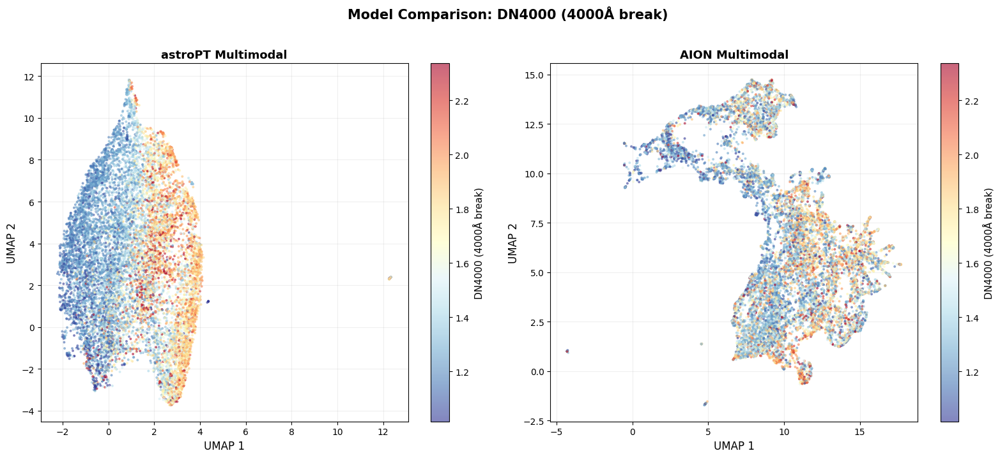

Saved: model_comparison_dn4000.png


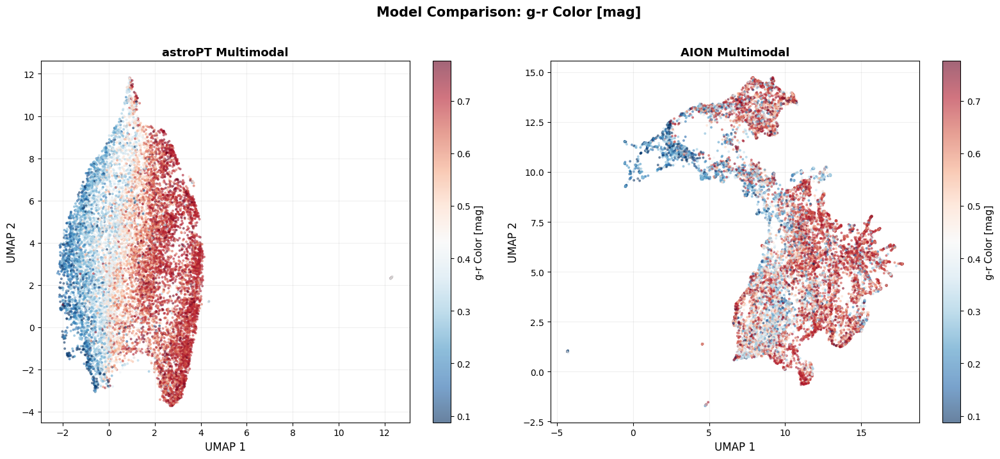

Saved: model_comparison_gr_color.png


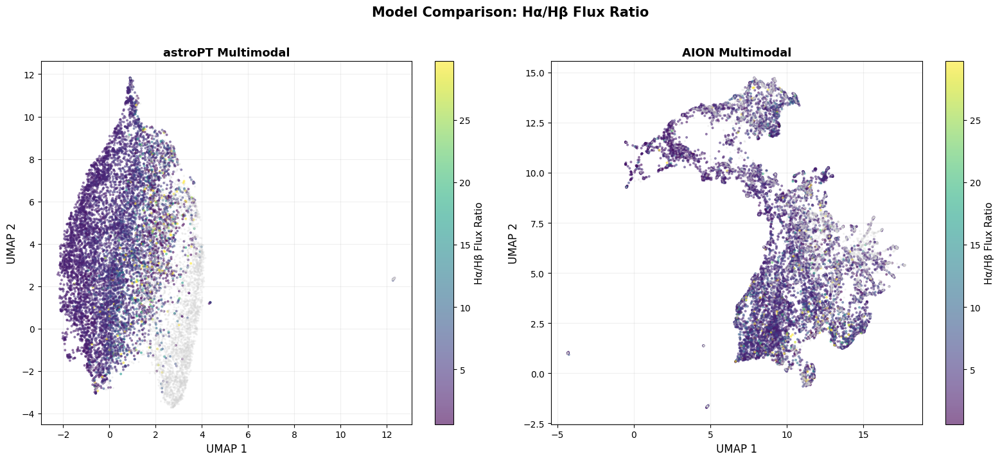

Saved: model_comparison_halpha_hbeta.png


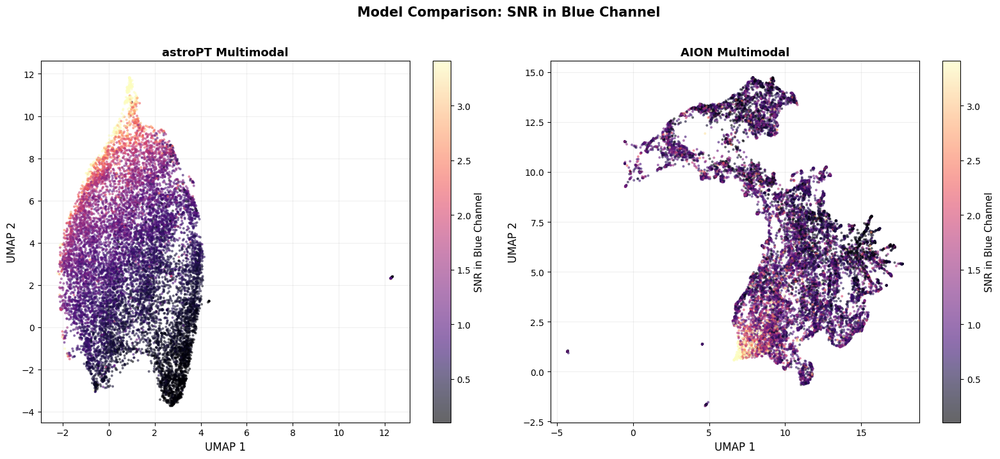

Saved: model_comparison_snr_b.png


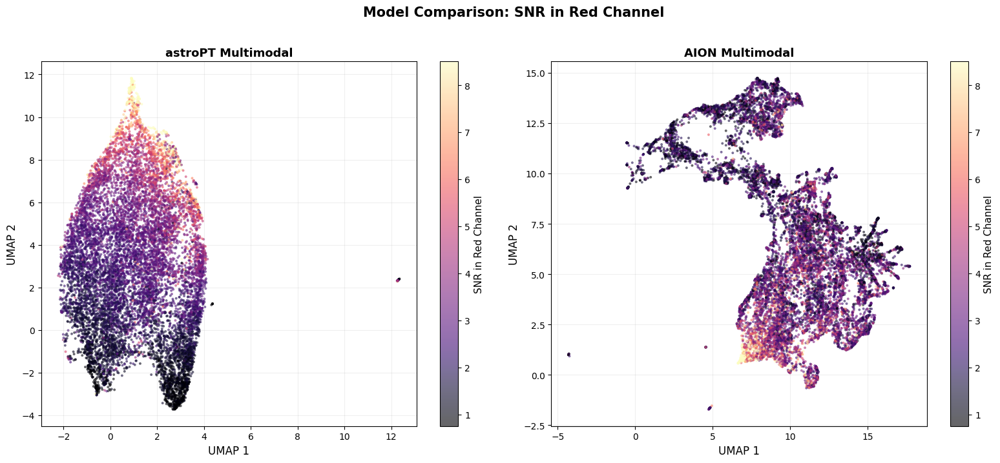

Saved: model_comparison_snr_r.png


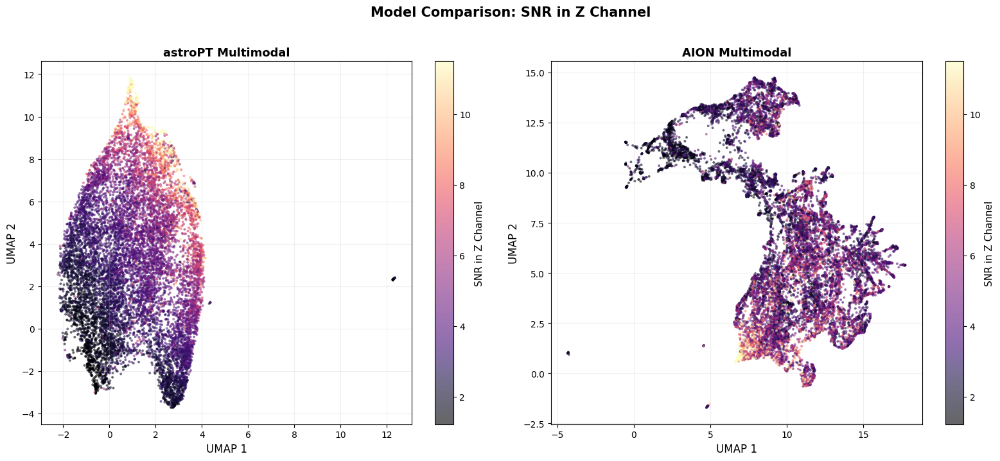

Saved: model_comparison_snr_z.png

MORPHOLOGICAL PROPERTIES COMPARISONS



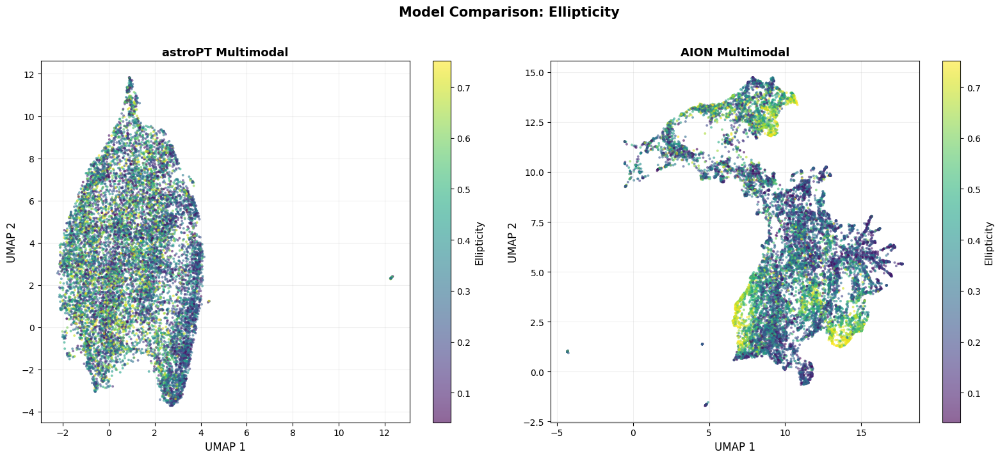

Saved: model_comparison_ellipticity.png


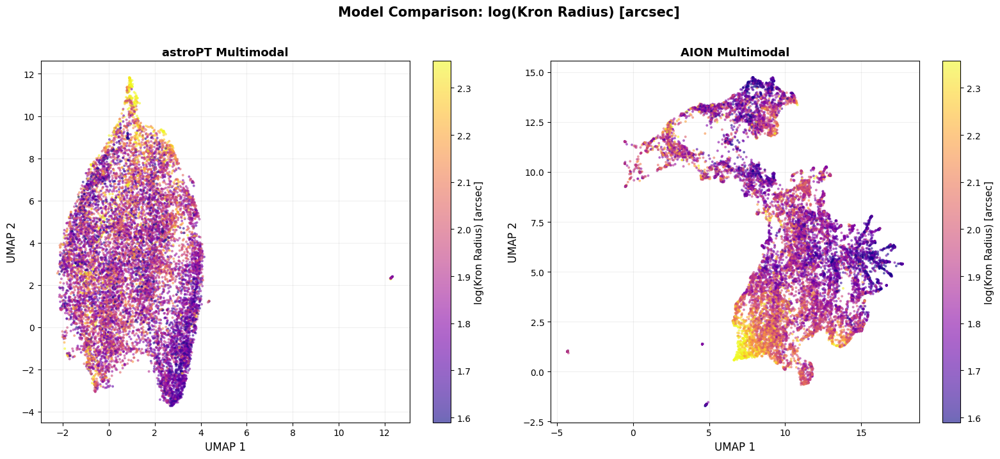

Saved: model_comparison_kron_radius.png


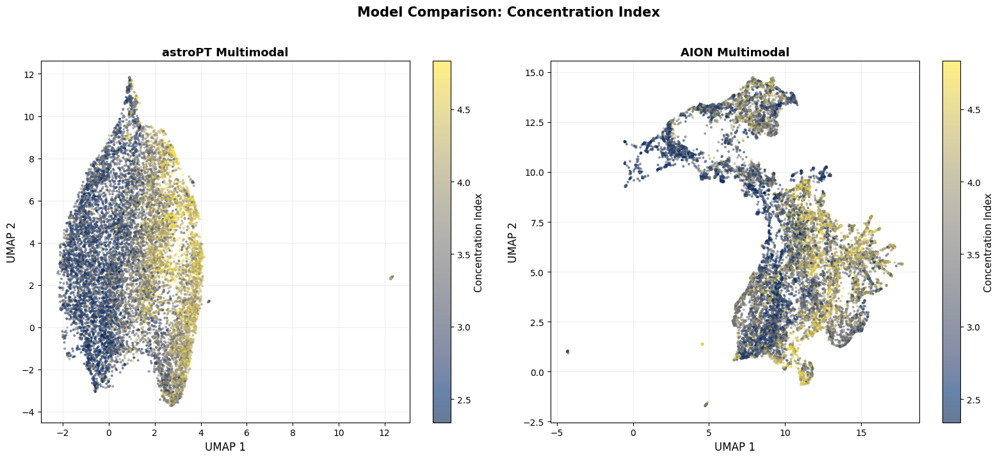

Saved: model_comparison_concentration.png


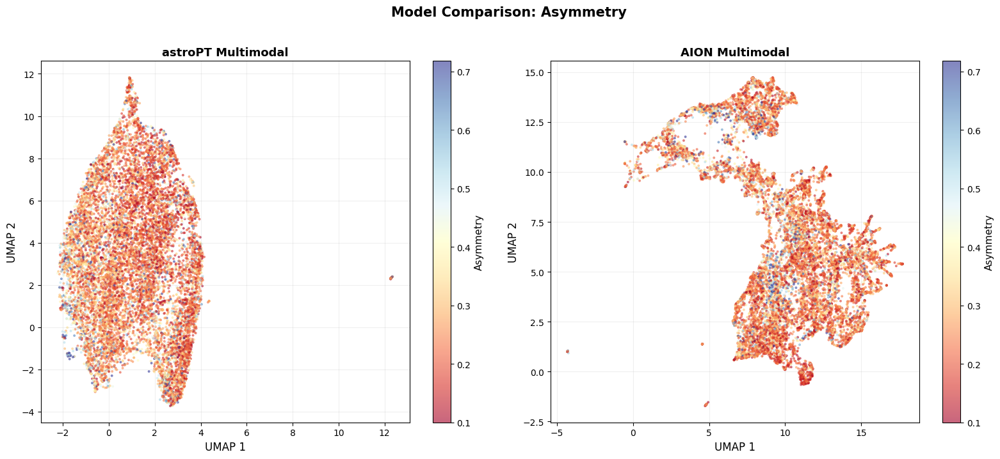

Saved: model_comparison_asymmetry.png


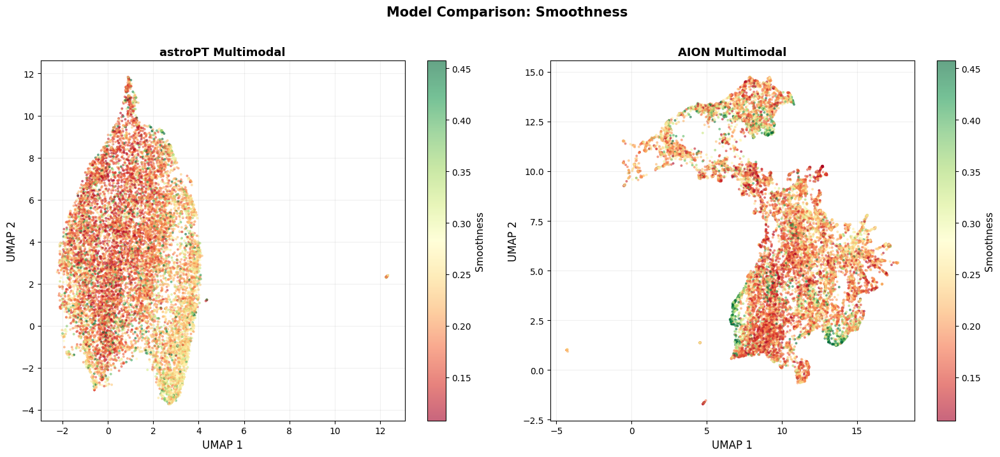

Saved: model_comparison_smoothness.png


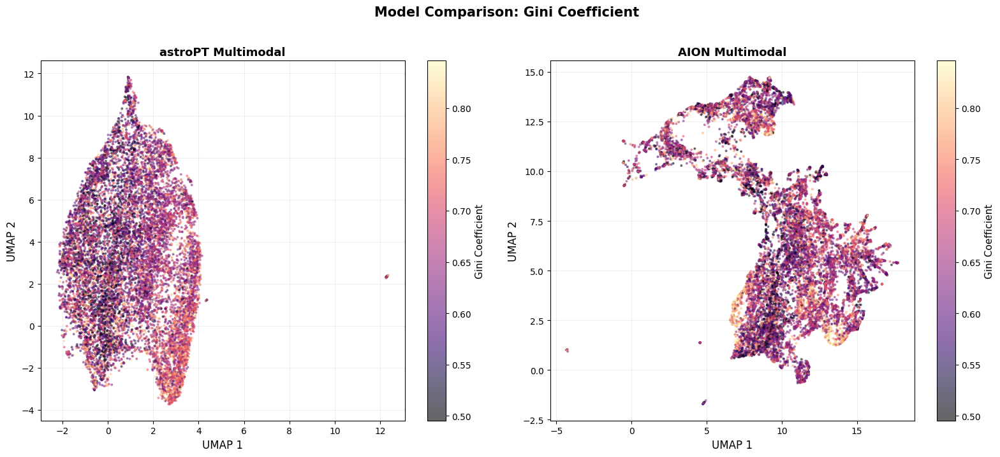

Saved: model_comparison_gini.png


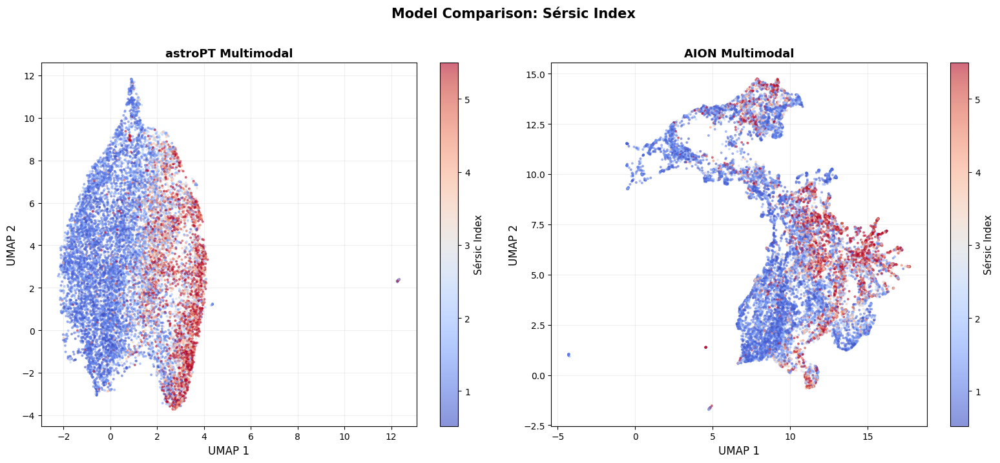

Saved: model_comparison_sersic_index.png


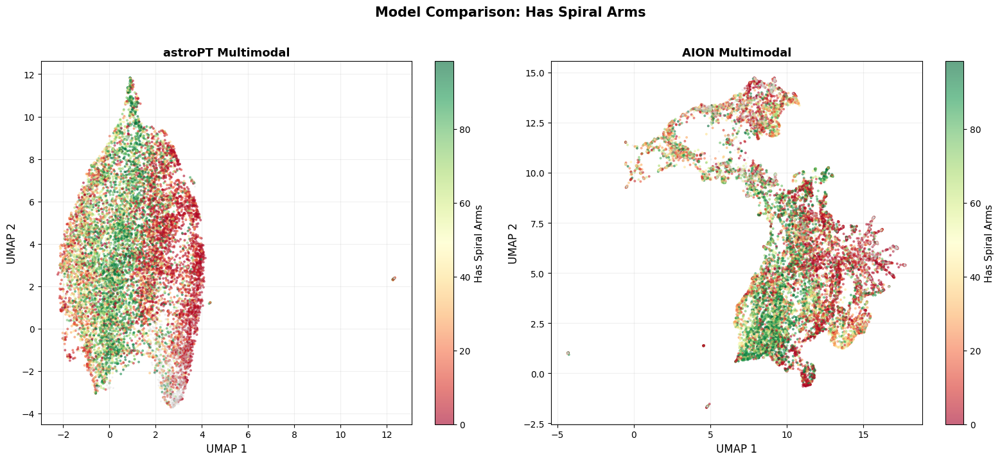

Saved: model_comparison_spiral_arms.png


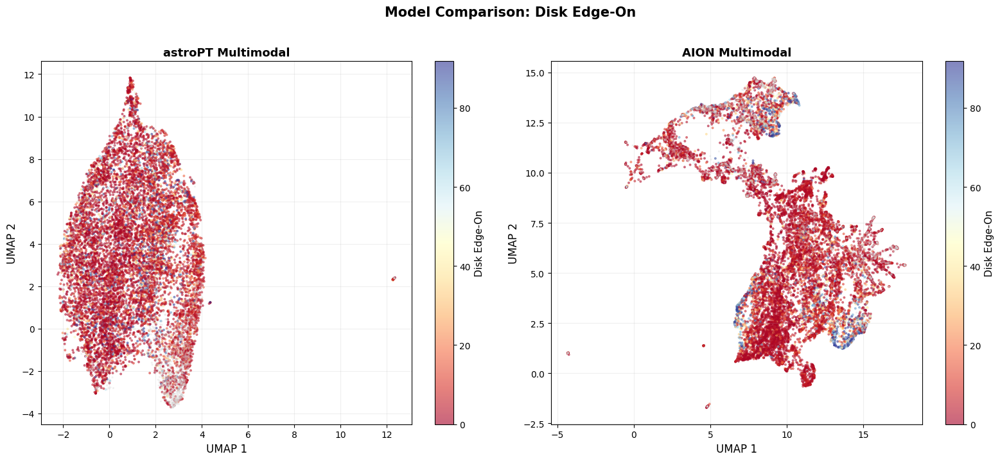

Saved: model_comparison_edge_on.png


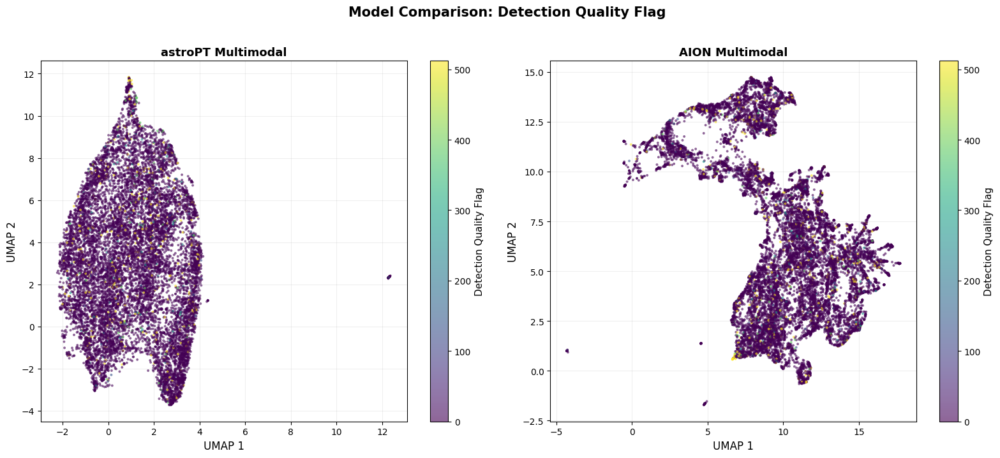

Saved: model_comparison_det_quality.png


In [10]:
def plot_property_comparison_2models(property_name, cmap, output_file, vmin=None, vmax=None):
    """Create 2-panel comparison for a physical property."""
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    projections = [umap_astropt, umap_aion]
    properties = [astropt_logm, aion_logm]  # Will be updated per property
    titles = ['astroPT Multimodal', 'AION Multimodal']
    
    # Select the appropriate property arrays
    if 'LOGM' in property_name or 'Stellar Mass' in property_name:
        properties = [astropt_logm, aion_logm]
    elif 'LOGSFR' in property_name or 'Formation Rate' in property_name:
        properties = [astropt_logsfr, aion_logsfr]
    elif 'sSFR' in property_name or 'Specific' in property_name:
        properties = [astropt_ssfr, aion_ssfr]
    elif 'DN4000' in property_name or '4000' in property_name:
        properties = [astropt_dn4000, aion_dn4000]
    elif 'g-r' in property_name or 'Color' in property_name:
        properties = [astropt_gr, aion_gr]
    elif 'Hα/Hβ' in property_name or 'Flux Ratio' in property_name:
        properties = [astropt_halpha_hbeta_ratio, aion_halpha_hbeta_ratio]
    elif 'SNR in Blue' in property_name:
        properties = [astropt_snr_b, aion_snr_b]
    elif 'SNR in Red' in property_name:
        properties = [astropt_snr_r, aion_snr_r]
    elif 'SNR in Z' in property_name:
        properties = [astropt_snr_z, aion_snr_z]
    elif 'Ellipticity' in property_name:
        properties = [astropt_ellipticity, aion_ellipticity]
    elif 'Kron Radius' in property_name:
        properties = [np.log10(astropt_kron_radius), np.log10(aion_kron_radius)]
    elif 'Concentration' in property_name:
        properties = [astropt_concentration, aion_concentration]
    elif 'Asymmetry' in property_name:
        properties = [astropt_asymmetry, aion_asymmetry]
    elif 'Smoothness' in property_name:
        properties = [astropt_smoothness, aion_smoothness]
    elif 'Gini' in property_name:
        properties = [astropt_gini, aion_gini]
    elif 'Sérsic' in property_name:
        properties = [astropt_sersic_index, aion_sersic_index]
    elif 'Spiral Arms' in property_name:
        properties = [astropt_has_spiral_arms, aion_has_spiral_arms]
    elif 'Edge-On' in property_name:
        properties = [astropt_disk_edge_on, aion_disk_edge_on]
    elif 'Quality' in property_name:
        properties = [astropt_det_quality_flag, aion_det_quality_flag]
    
    # Compute global vmin/vmax across all datasets for consistent coloring
    all_data = np.concatenate([p[~np.isnan(p)] for p in properties if (~np.isnan(p)).sum() > 0])
    
    if len(all_data) == 0:
        print(f"⚠ No valid data for {property_name}, skipping")
        plt.close(fig)
        return
    
    # Use provided vmin/vmax or calculate from data
    if vmin is None:
        vmin = np.percentile(all_data, 2)
    if vmax is None:
        vmax = np.percentile(all_data, 98)
    
    for ax, proj, prop_data, title in zip(axes, projections, properties, titles):
        valid_mask = ~np.isnan(prop_data)
        
        if valid_mask.sum() > 0:
            scatter = ax.scatter(
                proj[valid_mask, 0],
                proj[valid_mask, 1],
                c=prop_data[valid_mask],
                cmap=cmap,
                s=8,
                alpha=0.6,
                edgecolors='none',
                vmin=vmin,
                vmax=vmax
            )
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label(property_name, fontsize=11)
            
            # Plot invalid
            if (~valid_mask).sum() > 0:
                ax.scatter(
                    proj[~valid_mask, 0],
                    proj[~valid_mask, 1],
                    s=5,
                    color='lightgray',
                    alpha=0.3,
                    edgecolors='none'
                )
        
        ax.set_xlabel('UMAP 1', fontsize=12)
        ax.set_ylabel('UMAP 2', fontsize=12)
        ax.set_title(title, fontsize=13, fontweight='bold')
        ax.grid(alpha=0.2)
    
    fig.suptitle(f'Model Comparison: {property_name}', fontsize=15, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Saved: {output_file}")

# Generate comparison plots for spectral/physical properties
print("\n" + "="*70)
print("SPECTRAL/PHYSICAL PROPERTIES COMPARISONS")
print("="*70 + "\n")

spectral_property_configs = [
    ('log(M*/M☉) - Stellar Mass', 'plasma', 'model_comparison_logm.png', 8, 11),
    ('log(SFR) [M☉/yr] - Star Formation Rate', 'coolwarm', 'model_comparison_logsfr.png', -8, -2),
    ('log(sSFR) [yr⁻¹] - Specific SFR', 'coolwarm', 'model_comparison_ssfr.png', None, None),
    ('DN4000 (4000Å break)', 'RdYlBu_r', 'model_comparison_dn4000.png', None, None),
    ('g-r Color [mag]', 'RdBu_r', 'model_comparison_gr_color.png', None, None),
    ('Hα/Hβ Flux Ratio', 'viridis', 'model_comparison_halpha_hbeta.png', None, None),
    ('SNR in Blue Channel', 'magma', 'model_comparison_snr_b.png', None, None),
    ('SNR in Red Channel', 'magma', 'model_comparison_snr_r.png', None, None),
    ('SNR in Z Channel', 'magma', 'model_comparison_snr_z.png', None, None),
]

for prop_name, cmap, output_file, vmin, vmax in spectral_property_configs:
    plot_property_comparison_2models(prop_name, cmap, output_file, vmin, vmax)

# Generate comparison plots for morphological properties
print("\n" + "="*70)
print("MORPHOLOGICAL PROPERTIES COMPARISONS")
print("="*70 + "\n")

morphological_property_configs = [
    ('Ellipticity', 'viridis', 'model_comparison_ellipticity.png', None, None),
    ('log(Kron Radius) [arcsec]', 'plasma', 'model_comparison_kron_radius.png', None, None),
    ('Concentration Index', 'cividis', 'model_comparison_concentration.png', None, None),
    ('Asymmetry', 'RdYlBu', 'model_comparison_asymmetry.png', None, None),
    ('Smoothness', 'RdYlGn', 'model_comparison_smoothness.png', None, None),
    ('Gini Coefficient', 'magma', 'model_comparison_gini.png', None, None),
    ('Sérsic Index', 'coolwarm', 'model_comparison_sersic_index.png', None, None),
    ('Has Spiral Arms', 'RdYlGn', 'model_comparison_spiral_arms.png', None, None),
    ('Disk Edge-On', 'RdYlBu', 'model_comparison_edge_on.png', None, None),
    ('Detection Quality Flag', 'viridis', 'model_comparison_det_quality.png', None, None),
]

for prop_name, cmap, output_file, vmin, vmax in morphological_property_configs:
    plot_property_comparison_2models(prop_name, cmap, output_file, vmin, vmax)

## 8. Correlation Analysis - Model Comparison

Compare how well physical properties correlate with embedding dimensions across different models.

In [11]:
def correlation_analysis(umap_proj, properties_dict, name):
    """Compute Spearman correlations between UMAP dimensions and physical properties."""
    print(f"\n{'='*70}")
    print(f"CORRELATION ANALYSIS: {name}")
    print(f"{'='*70}")
    
    print(f"\n{'Property':<25} {'UMAP-1':>10} {'UMAP-2':>10} {'|corr|':>10}")
    print("-" * 70)
    
    results = {}
    
    for prop_name, prop_data in properties_dict.items():
        valid_mask = ~np.isnan(prop_data)
        if valid_mask.sum() > 100:
            corr1, pval1 = spearmanr(umap_proj[valid_mask, 0], prop_data[valid_mask])
            corr2, pval2 = spearmanr(umap_proj[valid_mask, 1], prop_data[valid_mask])
            sig1 = "***" if pval1 < 0.001 else "**" if pval1 < 0.01 else "*" if pval1 < 0.05 else ""
            sig2 = "***" if pval2 < 0.001 else "**" if pval2 < 0.01 else "*" if pval2 < 0.05 else ""
            
            max_corr = max(abs(corr1), abs(corr2))
            results[prop_name] = max_corr
            
            print(f"{prop_name:<25} {corr1:>9.3f}{sig1} {corr2:>9.3f}{sig2} {max_corr:>10.3f}")
        else:
            results[prop_name] = np.nan
            print(f"{prop_name:<25} {'N/A':>10} {'N/A':>10} {'N/A':>10}")
    
    print("\nSignificance: *** p<0.001, ** p<0.01, * p<0.05")
    print("="*70)
    
    return results

# Analyze correlations for both models
astropt_properties = {
    'Redshift': astropt_redshifts,
    'LOGM': astropt_logm,
    'LOGSFR': astropt_logsfr,
    'sSFR': astropt_ssfr,
    'DN4000': astropt_dn4000,
    'g-r Color': astropt_gr,
    'Ellipticity': astropt_ellipticity,
    'log(Kron Radius)': np.log10(astropt_kron_radius),
    'Concentration': astropt_concentration,
    'Asymmetry': astropt_asymmetry,
    'Smoothness': astropt_smoothness,
    'Gini': astropt_gini,
    'Sérsic Index': astropt_sersic_index,
}

aion_properties = {
    'Redshift': aion_redshifts,
    'LOGM': aion_logm,
    'LOGSFR': aion_logsfr,
    'sSFR': aion_ssfr,
    'DN4000': aion_dn4000,
    'g-r Color': aion_gr,
    'Ellipticity': aion_ellipticity,
    'log(Kron Radius)': np.log10(aion_kron_radius),
    'Concentration': aion_concentration,
    'Asymmetry': aion_asymmetry,
    'Smoothness': aion_smoothness,
    'Gini': aion_gini,
    'Sérsic Index': aion_sersic_index,
}

corr_astropt = correlation_analysis(umap_astropt, astropt_properties, "astroPT Multimodal")
corr_aion = correlation_analysis(umap_aion, aion_properties, "AION Multimodal")


CORRELATION ANALYSIS: astroPT Multimodal

Property                      UMAP-1     UMAP-2     |corr|
----------------------------------------------------------------------
Redshift                      0.645***    -0.472***      0.645
LOGM                          0.663***    -0.138***      0.663
LOGSFR                       -0.437***     0.011      0.437
sSFR                         -0.590***     0.001      0.590
DN4000                        0.684***    -0.080***      0.684
g-r Color                     0.838***    -0.102***      0.838
Ellipticity                  -0.134***     0.012      0.134
log(Kron Radius)             -0.125***     0.241***      0.241
Concentration                 0.658***     0.029**      0.658
Asymmetry                    -0.147***    -0.094***      0.147
Smoothness                    0.243***    -0.226***      0.243
Gini                          0.245***    -0.158***      0.245
Sérsic Index                  0.660***    -0.081***      0.660

Significance: ***

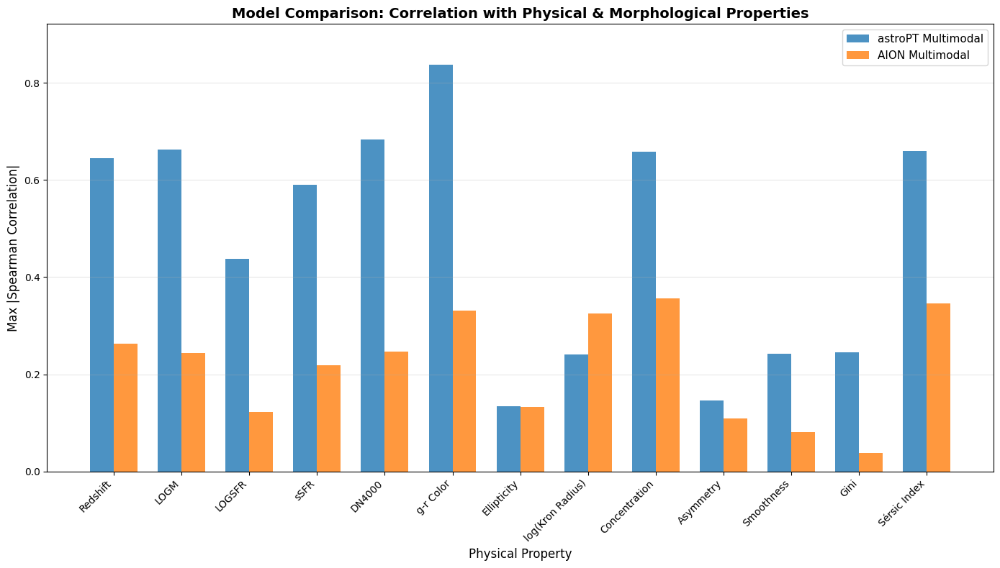

Saved: model_comparison_correlations.png


In [12]:
# Visualize correlation comparison
fig, ax = plt.subplots(figsize=(14, 8))

properties_list = list(corr_astropt.keys())
x = np.arange(len(properties_list))
width = 0.35

astropt_vals = [corr_astropt[p] for p in properties_list]
aion_vals = [corr_aion[p] for p in properties_list]

ax.bar(x - width/2, astropt_vals, width, label='astroPT Multimodal', alpha=0.8, color='#1f77b4')
ax.bar(x + width/2, aion_vals, width, label='AION Multimodal', alpha=0.8, color='#ff7f0e')

ax.set_xlabel('Physical Property', fontsize=12)
ax.set_ylabel('Max |Spearman Correlation|', fontsize=12)
ax.set_title('Model Comparison: Correlation with Physical & Morphological Properties', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(properties_list, rotation=45, ha='right')
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3)
ax.set_ylim(0, max(max(astropt_vals), max(aion_vals)) * 1.1)

plt.tight_layout()
plt.savefig('model_comparison_correlations.png', dpi=300, bbox_inches='tight')
plt.show()

print("Saved: model_comparison_correlations.png")

## 9. Direct Comparison on Common Objects

For objects present in both datasets, compare the embeddings directly.


Analyzing 12210 common catalog entries...

Cosine Similarity (astroPT vs AION multimodal):
  Mean: 0.0024
  Std: 0.0053
  Min: -0.0248
  Max: 0.0231
  Median: 0.0027


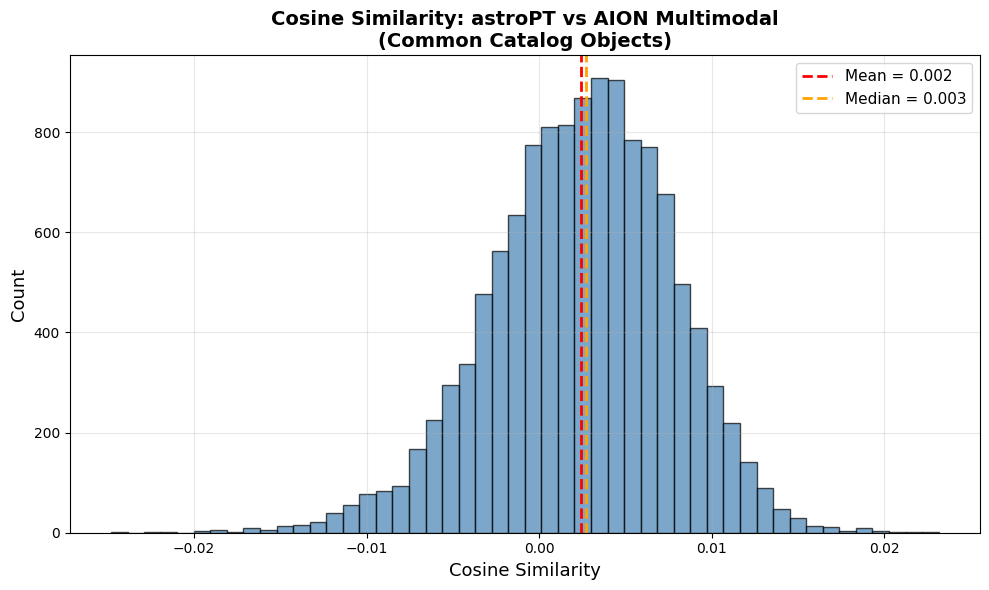


Saved: model_comparison_cosine_similarity.png


In [13]:
if len(common_catalog_indices) > 0:
    print(f"\nAnalyzing {len(common_catalog_indices)} common catalog entries...\n")
    
    # Extract embeddings for common objects
    astropt_common_emb = astropt_embeddings[astropt_common_indices]
    aion_common_emb = aion_embeddings[aion_common_indices]
    
    # Compute cosine similarities
    cosine_sims = []
    for i in range(len(astropt_common_emb)):
        sim = cosine_similarity(astropt_common_emb[i:i+1], aion_common_emb[i:i+1])[0, 0]
        cosine_sims.append(sim)
    
    cosine_sims = np.array(cosine_sims)
    
    print("Cosine Similarity (astroPT vs AION multimodal):")
    print(f"  Mean: {cosine_sims.mean():.4f}")
    print(f"  Std: {cosine_sims.std():.4f}")
    print(f"  Min: {cosine_sims.min():.4f}")
    print(f"  Max: {cosine_sims.max():.4f}")
    print(f"  Median: {np.median(cosine_sims):.4f}")
    
    # Plot distribution
    fig, ax = plt.subplots(figsize=(10, 6))
    
    ax.hist(cosine_sims, bins=50, alpha=0.7, edgecolor='black', color='steelblue')
    ax.axvline(cosine_sims.mean(), color='red', linestyle='--', linewidth=2, 
               label=f'Mean = {cosine_sims.mean():.3f}')
    ax.axvline(np.median(cosine_sims), color='orange', linestyle='--', linewidth=2, 
               label=f'Median = {np.median(cosine_sims):.3f}')
    
    ax.set_xlabel('Cosine Similarity', fontsize=13)
    ax.set_ylabel('Count', fontsize=13)
    ax.set_title('Cosine Similarity: astroPT vs AION Multimodal\n(Common Catalog Objects)', 
                 fontsize=14, fontweight='bold')
    ax.legend(fontsize=11)
    ax.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('model_comparison_cosine_similarity.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("\nSaved: model_comparison_cosine_similarity.png")
else:
    print("\n⚠ Skipping common objects cosine similarity analysis (no common catalog entries)")
    print("   Note: astroPT uses DESI TARGETIDs, AION uses Euclid object_ids")

## 10. Summary and Conclusions

Summarize the key findings from the model comparison.

In [14]:
print("="*80)
print("MULTIMODAL FOUNDATION MODELS COMPARISON SUMMARY")
print("="*80)

print("\n📊 DATASET SIZES:")
print(f"  • astroPT multimodal embeddings: {astropt_embeddings.shape}")
print(f"  • AION multimodal embeddings: {aion_embeddings.shape}")
print(f"  • Common catalog entries: {len(common_catalog_indices) if len(common_catalog_indices) > 0 else 'None'}")

print("\n🔍 KEY FINDINGS:")

print("\n1. astroPT MULTIMODAL:")
print(f"   • Transformer architecture trained on DESI spectra + Euclid images")
print(f"   • Checkpoint: iteration 21000")
print(f"   • Catalog matching: Uses DESI TARGETID")
print(f"   • Match rate: {astropt_match_rate:.1f}%")

print("\n2. AION MULTIMODAL:")
print(f"   • Foundation model trained on Euclid images + DESI spectra")
print(f"   • Embeddings combine spectral and imaging information")
print(f"   • Catalog matching: Uses Euclid object_id")
print(f"   • Match rate: {aion_match_rate:.1f}%")

if len(common_catalog_indices) > 0:
    print("\n3. DIRECT COMPARISON (Common Catalog Objects):")
    print(f"   • Found {len(common_catalog_indices)} objects in both datasets")
    print(f"   • Average cosine similarity: {cosine_sims.mean():.3f}")
    if cosine_sims.mean() > 0.7:
        print(f"   → High similarity: Models encode similar information")
    elif cosine_sims.mean() > 0.4:
        print(f"   → Moderate similarity: Models capture complementary features")
    else:
        print(f"   → Low similarity: Models focus on different aspects")
else:
    print("\n3. DIRECT COMPARISON:")
    print(f"   • Limited overlap due to different ID systems (DESI vs Euclid)")
    print(f"   • Comparison based on population-level statistics")

print("\n" + "="*80)
print("✓ Comparison analysis complete! All figures saved.")
print("="*80)

print("\n📁 Generated files:")
print("  Redshift comparison:")
print("    • model_comparison_redshift.png")
print("  Spectral/Physical properties:")
print("    • model_comparison_logm.png")
print("    • model_comparison_logsfr.png")
print("    • model_comparison_ssfr.png")
print("    • model_comparison_dn4000.png")
print("    • model_comparison_gr_color.png")
print("  Morphological properties:")
print("    • model_comparison_ellipticity.png")
print("    • model_comparison_kron_radius.png")
print("    • model_comparison_concentration.png")
print("    • model_comparison_asymmetry.png")
print("    • model_comparison_smoothness.png")
print("    • model_comparison_gini.png")
print("    • model_comparison_sersic_index.png")
print("    • model_comparison_spiral_arms.png")
print("    • model_comparison_edge_on.png")
print("    • model_comparison_det_quality.png")
print("  Correlation analysis:")
print("    • model_comparison_correlations.png")
if len(common_catalog_indices) > 0:
    print("  Direct comparison:")
    print("    • model_comparison_cosine_similarity.png")

MULTIMODAL FOUNDATION MODELS COMPARISON SUMMARY

📊 DATASET SIZES:
  • astroPT multimodal embeddings: (12210, 768)
  • AION multimodal embeddings: (15263, 768)
  • Common catalog entries: 12210

🔍 KEY FINDINGS:

1. astroPT MULTIMODAL:
   • Transformer architecture trained on DESI spectra + Euclid images
   • Checkpoint: iteration 21000
   • Catalog matching: Uses DESI TARGETID
   • Match rate: 100.0%

2. AION MULTIMODAL:
   • Foundation model trained on Euclid images + DESI spectra
   • Embeddings combine spectral and imaging information
   • Catalog matching: Uses Euclid object_id
   • Match rate: 100.0%

3. DIRECT COMPARISON (Common Catalog Objects):
   • Found 12210 objects in both datasets
   • Average cosine similarity: 0.002
   → Low similarity: Models focus on different aspects

✓ Comparison analysis complete! All figures saved.

📁 Generated files:
  Redshift comparison:
    • model_comparison_redshift.png
  Spectral/Physical properties:
    • model_comparison_logm.png
    • mode